In [2]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import nibabel as nib
import numpy as np
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import imageio
from tqdm import tqdm
from IPython.display import display, Image, HTML

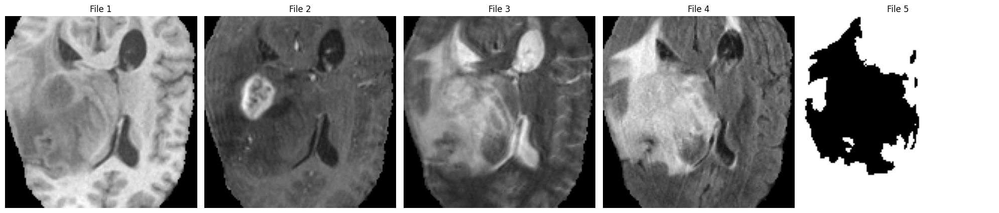

In [3]:
import matplotlib.pyplot as plt

file_paths = [
    'E:/Images/Sample_001/Img1_Native_T1.nii',
    'E:/Images/Sample_001/Img2_T1_Gd_Weighted.nii',
    'E:/Images/Sample_001/Img3_T2_Weighted.nii',
    'E:/Images/Sample_001/Img4_T2_FLAIR.nii',
    'E:/Images/Sample_001/Img5_Segmented.nii'
]

plt.figure(figsize=(20, 10))

for i, file_path in enumerate(file_paths):
    
    nii_img = nib.load(file_path)
    image_data = nii_img.get_fdata()

   
    slice_index = image_data.shape[2] // 2
    slice_data = image_data[:, :, slice_index]

    
    if len(slice_data.shape) > 2:
        slice_data = slice_data[..., 0]

    
    plt.subplot(1, len(file_paths), i + 1)
    plt.imshow(slice_data.T, cmap="gray", origin="lower") 
    plt.title(f"File {i + 1}", fontsize=12)
    plt.axis("off")


plt.tight_layout()
plt.show()

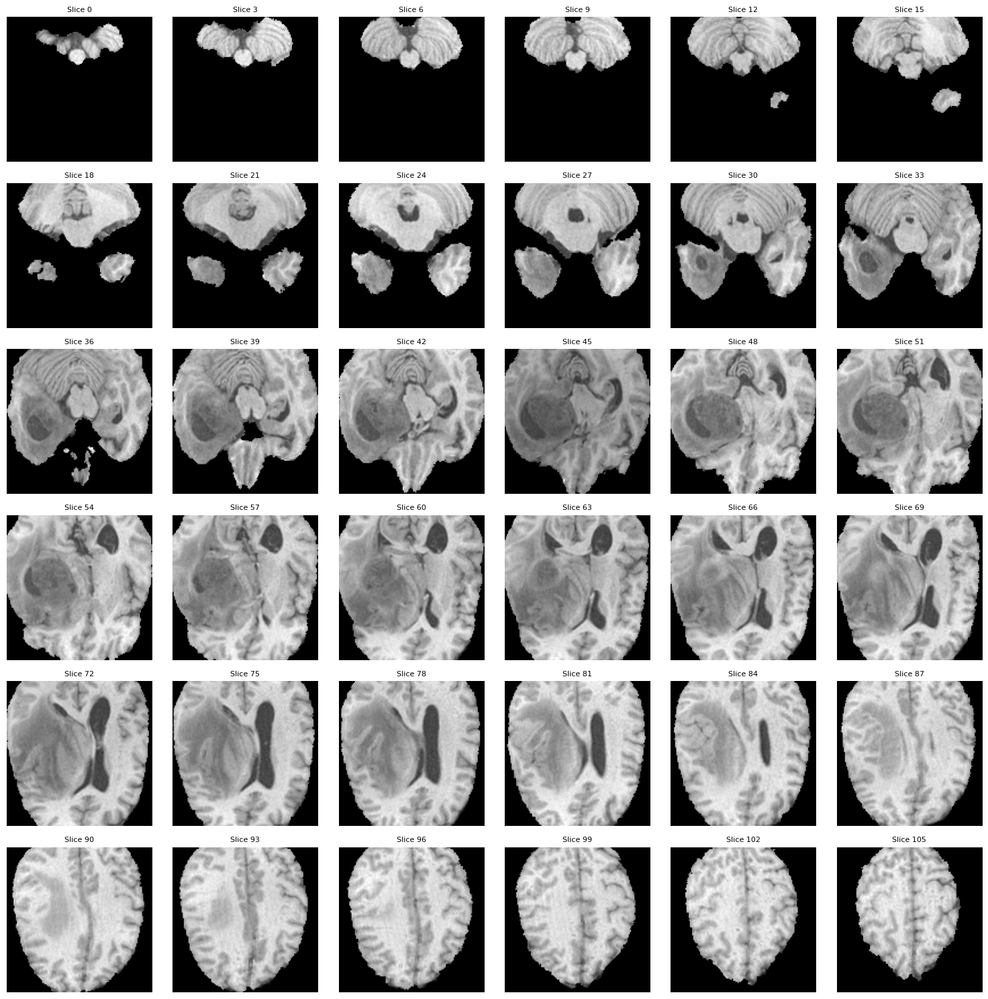

In [4]:


file_path = 'E:/Images/Sample_001/Img1_Native_T1.nii'


nii_img = nib.load(file_path)
image_data = nii_img.get_fdata()


num_rows = 6  
num_cols = 6  
num_slices = num_rows * num_cols


step = image_data.shape[2] // num_slices


fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 15))
axes = axes.flatten()


for i, ax in enumerate(axes):
    slice_index = i * step
    if slice_index < image_data.shape[2]: 
        slice_data = image_data[:, :, slice_index]
        ax.imshow(slice_data.T, cmap="gray", origin="lower")  
        ax.axis("off")
        ax.set_title(f"Slice {slice_index}", fontsize=8)
    else:
        ax.axis("off") 
        

plt.tight_layout()
plt.show()


In [5]:

import imageio


file_paths = [
    'E:/Images/Sample_001/Img1_Native_T1.nii',
    'E:/Images/Sample_001/Img2_T1_Gd_Weighted.nii',
    'E:/Images/Sample_001/Img3_T2_Weighted.nii',
    'E:/Images/Sample_001/Img4_T2_FLAIR.nii',
    'E:/Images/Sample_001/Img5_Segmented.nii'
]


output_dir = './gifs/'
os.makedirs(output_dir, exist_ok=True)  


for file_path in file_paths:
    
    nii_img = nib.load(file_path)
    image_data = nii_img.get_fdata()
    
   
    image_data = (image_data - np.min(image_data)) / (np.max(image_data) - np.min(image_data)) * 255
    image_data = image_data.astype(np.uint8)
    
    
    frames = []
    for i in range(image_data.shape[2]):  
        slice_data = image_data[:, :, i]
        frames.append(slice_data)
    
    
    gif_name = os.path.basename(file_path).replace('.nii', '.gif')
    gif_output_path = os.path.join(output_dir, gif_name)
    
    
    imageio.mimsave(gif_output_path, frames, duration=0.1)  
    
    print(f"GIF saved to {gif_output_path}")


GIF saved to ./gifs/Img1_Native_T1.gif
GIF saved to ./gifs/Img2_T1_Gd_Weighted.gif
GIF saved to ./gifs/Img3_T2_Weighted.gif
GIF saved to ./gifs/Img4_T2_FLAIR.gif
GIF saved to ./gifs/Img5_Segmented.gif


Displaying Img1_Native_T1.gif


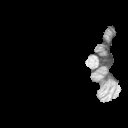

Displaying Img2_T1_Gd_Weighted.gif


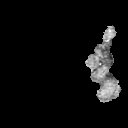

Displaying Img3_T2_Weighted.gif


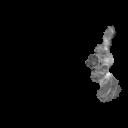

Displaying Img4_T2_FLAIR.gif


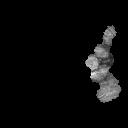

Displaying Img5_Segmented.gif


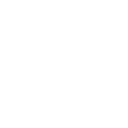

In [6]:
from IPython.display import display, Image
import os


output_dir = './gifs/'


gif_files = [f for f in os.listdir(output_dir) if f.endswith('.gif')]


for gif_file in gif_files:
    gif_path = os.path.join(output_dir, gif_file)
    print(f"Displaying {gif_file}")
    display(Image(filename=gif_path))


In [7]:
class MRI3DDataset(Dataset):
    def __init__(self, img_paths, is_test=False):
        self.img_paths = img_paths
        self.is_test = is_test
    
    def load_nifti(self, path, is_segmentation=False):
        nii_img = nib.load(path)
        data = nii_img.get_fdata()
        data = np.nan_to_num(data, nan=0.0, posinf=0.0, neginf=0.0)
        tensor_data = torch.tensor(data, dtype=torch.float32)
        
        if is_segmentation and len(tensor_data.shape) == 4:
            tensor_data = tensor_data.permute(3, 0, 1, 2)
        
        return tensor_data

    def normalize(self, image):
        for i in range(image.shape[0]):
            min_val = torch.min(image[i])
            max_val = torch.max(image[i])
            if max_val - min_val != 0:
                image[i] = (image[i] - min_val) / (max_val - min_val)
            else:
                image[i] = torch.zeros_like(image[i])
        return image

    def __getitem__(self, idx):
        base_path = self.img_paths[idx]
        img_t1 = self.load_nifti(os.path.join(base_path, 'Img1_Native_T1.nii'))
        img_t1c = self.load_nifti(os.path.join(base_path, 'Img2_T1_Gd_Weighted.nii'))
        img_t2 = self.load_nifti(os.path.join(base_path, 'Img3_T2_Weighted.nii'))
        img_flair = self.load_nifti(os.path.join(base_path, 'Img4_T2_FLAIR.nii'))
        
        image = torch.stack([img_t1, img_t1c, img_t2, img_flair], dim=0)
        image = self.normalize(image)
        
        if self.is_test:
            return image
        else:
            img_seg = self.load_nifti(os.path.join(base_path, 'Img5_Segmented.nii'), is_segmentation=True)
            return image, img_seg

    def __len__(self):
        return len(self.img_paths)

In [8]:
class UNet3D(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UNet3D, self).__init__()
        
        self.enc1 = self.conv_block(in_channels, 32)
        self.pool1 = nn.MaxPool3d(kernel_size=2, stride=2)
        self.enc2 = self.conv_block(32, 64)
        self.pool2 = nn.MaxPool3d(kernel_size=2, stride=2)
        self.enc3 = self.conv_block(64, 128)
        self.pool3 = nn.MaxPool3d(kernel_size=2, stride=2)
        self.enc4 = self.conv_block(128, 256)
        self.pool4 = nn.MaxPool3d(kernel_size=2, stride=2)
        
        self.bottleneck = self.conv_block(256, 512)
        
        self.upconv4 = nn.ConvTranspose3d(512, 256, kernel_size=2, stride=2)
        self.dec4 = self.conv_block(512, 256)
        self.upconv3 = nn.ConvTranspose3d(256, 128, kernel_size=2, stride=2)
        self.dec3 = self.conv_block(256, 128)
        self.upconv2 = nn.ConvTranspose3d(128, 64, kernel_size=2, stride=2)
        self.dec2 = self.conv_block(128, 64)
        self.upconv1 = nn.ConvTranspose3d(64, 32, kernel_size=2, stride=2)
        self.dec1 = self.conv_block(64, 32)
        
        self.final = nn.Conv3d(32, out_channels, kernel_size=1)
    
    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv3d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm3d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv3d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm3d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool1(e1))
        e3 = self.enc3(self.pool2(e2))
        e4 = self.enc4(self.pool3(e3))
        
        b = self.bottleneck(self.pool4(e4))
        
        d4 = self.dec4(torch.cat([self.upconv4(b), e4], dim=1))
        d3 = self.dec3(torch.cat([self.upconv3(d4), e3], dim=1))
        d2 = self.dec2(torch.cat([self.upconv2(d3), e2], dim=1))
        d1 = self.dec1(torch.cat([self.upconv1(d2), e1], dim=1))
        
        return self.final(d1)



In [9]:
def dice_score(pred, target, smooth=1e-6):
    dice_scores = []
    n_classes = pred.shape[1]
    
    for class_idx in range(n_classes):
        pred_class = pred[:, class_idx, ...]
        target_class = target[:, class_idx, ...]
        
        intersection = (pred_class * target_class).sum(dim=(1, 2, 3))
        pred_sum = pred_class.sum(dim=(1, 2, 3))
        target_sum = target_class.sum(dim=(1, 2, 3))
        
        dice = (2. * intersection + smooth) / (pred_sum + target_sum + smooth)
        dice_scores.append(dice.mean().item())
    
    return dice_scores

In [10]:
def evaluate_model(model, test_loader, criterion, device):
    model.eval()
    test_loss = 0.0
    all_dice_scores = []
    
    with torch.no_grad():
        pbar = tqdm(test_loader, desc="Evaluating", leave=False)
        for data, target in pbar:
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += criterion(output, target).item()
            
            pred = F.softmax(output, dim=1)
            pred_one_hot = (pred > 0.5).float()
            
            if target.shape[1] == 1:
                target_one_hot = torch.zeros_like(output)
                target_one_hot.scatter_(1, target, 1)
            else:
                target_one_hot = target
            
            dice_scores = dice_score(pred_one_hot, target_one_hot)
            all_dice_scores.append(dice_scores)
            
            current_avg_dice = np.mean(all_dice_scores, axis=0)
            pbar.set_postfix({'dice': f'{np.mean(current_avg_dice):.4f}'})
    
    avg_dice = np.mean(all_dice_scores, axis=0)
    avg_test_loss = test_loss / len(test_loader)
    
    return avg_test_loss, avg_dice

In [11]:
def save_checkpoint(checkpoint_data, is_best, checkpoint_path='model_checkpoint.pth'):
    # First save to a temporary file
    temp_path = checkpoint_path + '.tmp'
    torch.save(checkpoint_data, temp_path)
    
    # Then rename it to the actual checkpoint file (atomic operation)
    if os.path.exists(checkpoint_path):
        os.replace(temp_path, checkpoint_path)
    else:
        os.rename(temp_path, checkpoint_path)
    
    # Save best model if needed
    if is_best:
        best_path = 'best_model.pth'
        temp_best_path = best_path + '.tmp'
        torch.save(checkpoint_data, temp_best_path)
        if os.path.exists(best_path):
            os.replace(temp_best_path, best_path)
        else:
            os.rename(temp_best_path, best_path)

In [12]:
def train_model(model, train_loader, test_loader, num_epochs, device, checkpoint_path='model_checkpoint.pth', start_epoch=0):
    model.to(device)
    
    # Enable cudnn benchmarking for faster training
    torch.backends.cudnn.benchmark = True
    
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=3e-4, weight_decay=1e-5)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3, verbose=True)
    
    best_test_loss = float('inf')
    
    if os.path.exists(checkpoint_path) and start_epoch > 0:
        print(f"Loading checkpoint from epoch {start_epoch}")
        checkpoint = torch.load(checkpoint_path)
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
        best_test_loss = checkpoint['best_test_loss']
    
    total_epochs = start_epoch + num_epochs
    
    try:
        for epoch in range(start_epoch, total_epochs):
            # Training phase
            model.train()
            running_loss = 0.0
            
            pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{total_epochs}")
            for batch_idx, (data, target) in enumerate(pbar):
                data, target = data.to(device), target.to(device)
                
                optimizer.zero_grad(set_to_none=True)  # Slightly faster than zero_grad()
                output = model(data)
                loss = criterion(output, target)
                loss.backward()
                optimizer.step()
                
                running_loss += loss.item()
                avg_loss = running_loss / (batch_idx + 1)
                pbar.set_postfix({'train_loss': f'{avg_loss:.4f}'})
            
            # Evaluation phase
            test_loss, test_dice = evaluate_model(model, test_loader, criterion, device)
            scheduler.step(test_loss)
            
            # Print results
            print(f"\nEpoch {epoch+1}/{total_epochs}:")
            print(f"Training Loss: {avg_loss:.4f}")
            print(f"Test Loss: {test_loss:.4f}")
            print(f"Test Dice Scores:")
            print(f"- Background: {test_dice[0]:.4f}")
            print(f"- Necrotic core: {test_dice[1]:.4f}")
            print(f"- Peritumoral edema: {test_dice[2]:.4f}")
            print(f"- GD-enhancing tumor: {test_dice[3]:.4f}")
            print(f"Mean Test Dice Score: {np.mean(test_dice):.4f}\n")
            
            # Save checkpoint
            checkpoint_data = {
                'epoch': epoch + 1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'loss': test_loss,
                'best_test_loss': best_test_loss,
                'dice_scores': test_dice,
            }
            
            is_best = test_loss < best_test_loss
            if is_best:
                best_test_loss = test_loss
                print(f"New best model saved! (Test Loss: {test_loss:.4f})")
            
            save_checkpoint(checkpoint_data, is_best, checkpoint_path)
            
    except KeyboardInterrupt:
        print("\nTraining interrupted. Saving checkpoint...")
        checkpoint_data = {
            'epoch': epoch,  # Save the last completed epoch
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict': scheduler.state_dict(),
            'loss': test_loss if 'test_loss' in locals() else float('inf'),
            'best_test_loss': best_test_loss,
            'dice_scores': test_dice if 'test_dice' in locals() else None,
        }
        save_checkpoint(checkpoint_data, False, checkpoint_path)
        print(f"Checkpoint saved at epoch {epoch}. Resume with start_epoch={epoch}")
        
    except Exception as e:
        print(f"\nError during training: {str(e)}")
        if 'epoch' in locals():
            print(f"Attempting to save checkpoint at epoch {epoch}...")
            checkpoint_data = {
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'loss': test_loss if 'test_loss' in locals() else float('inf'),
                'best_test_loss': best_test_loss,
                'dice_scores': test_dice if 'test_dice' in locals() else None,
            }
            save_checkpoint(checkpoint_data, False, checkpoint_path)
            print(f"Checkpoint saved. Resume with start_epoch={epoch}")
        raise

In [13]:
model = UNet3D(in_channels=4, out_channels=4)


In [43]:
if __name__ == "__main__":
    # Enable deterministic training for reproducibility
    torch.backends.cudnn.deterministic = False
    torch.backends.cudnn.benchmark = True
    
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")
    
    base_path = "E:/Images"
    train_samples = [os.path.join(base_path, f"Sample_{i:03d}") for i in range(1, 261)]
    test_samples = [os.path.join(base_path, f"Sample_{i:03d}") for i in range(261, 321)]
    
    print(f"Number of training samples: {len(train_samples)}")
    print(f"Number of test samples: {len(test_samples)}")
    
    try:
        # Initialize datasets
        train_dataset = MRI3DDataset(train_samples, is_test=False)
        test_dataset = MRI3DDataset(test_samples, is_test=False)
        
        # Use single-process data loading
        train_loader = DataLoader(
            train_dataset, 
            batch_size=1, 
            shuffle=True,
            num_workers=0,  # Single-process data loading
            pin_memory=True if torch.cuda.is_available() else False
        )
        
        test_loader = DataLoader(
            test_dataset, 
            batch_size=1, 
            shuffle=False,
            num_workers=0,  # Single-process data loading
            pin_memory=True if torch.cuda.is_available() else False
        )
        
        model = UNet3D(in_channels=4, out_channels=4)
        
        # Optional: Set larger timeout for data loading
        torch.multiprocessing.set_sharing_strategy('file_system')
        
        train_model(model, train_loader, test_loader, num_epochs=100, device=device)
        
    except Exception as e:
        print(f"Error during execution: {str(e)}")
        raise

c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Using device: cpu
Number of training samples: 260
Number of test samples: 60


Epoch 1/100: 100%|██████████| 260/260 [42:23<00:00,  9.78s/it, train_loss=0.7053]



Epoch 1/100:
Training Loss: 0.7053
Test Loss: 0.4111
Test Dice Scores:
- Background: 0.9801
- Necrotic core: 0.0003
- Peritumoral edema: 0.3040
- GD-enhancing tumor: 0.0708
Mean Test Dice Score: 0.3388

New best model saved! (Test Loss: 0.4111)


Epoch 2/100: 100%|██████████| 260/260 [43:02<00:00,  9.93s/it, train_loss=0.2377]



Epoch 2/100:
Training Loss: 0.2377
Test Loss: 0.2473
Test Dice Scores:
- Background: 0.9797
- Necrotic core: 0.0151
- Peritumoral edema: 0.4667
- GD-enhancing tumor: 0.0832
Mean Test Dice Score: 0.3862

New best model saved! (Test Loss: 0.2473)


Epoch 3/100: 100%|██████████| 260/260 [42:39<00:00,  9.84s/it, train_loss=0.1362]



Epoch 3/100:
Training Loss: 0.1362
Test Loss: 0.1844
Test Dice Scores:
- Background: 0.9812
- Necrotic core: 0.1968
- Peritumoral edema: 0.4857
- GD-enhancing tumor: 0.0949
Mean Test Dice Score: 0.4396

New best model saved! (Test Loss: 0.1844)


Epoch 4/100:   0%|          | 1/260 [00:20<1:28:37, 20.53s/it, train_loss=0.0737]



Training interrupted. Saving checkpoint...
Checkpoint saved at epoch 3. Resume with start_epoch=3


In [73]:
train_model(model, train_loader, test_loader, num_epochs=97, device=device, start_epoch=3)

C:\Users\User\AppData\Local\Temp\ipykernel_13784\3272286077.py:15: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path)


Loading checkpoint from epoch 3


Epoch 4/100: 100%|██████████| 260/260 [39:58<00:00,  9.22s/it, train_loss=0.1047]



Epoch 4/100:
Training Loss: 0.1047
Test Loss: 0.1999
Test Dice Scores:
- Background: 0.9796
- Necrotic core: 0.3273
- Peritumoral edema: 0.4602
- GD-enhancing tumor: 0.2825
Mean Test Dice Score: 0.5124



Epoch 5/100: 100%|██████████| 260/260 [40:45<00:00,  9.40s/it, train_loss=0.0880]



Epoch 5/100:
Training Loss: 0.0880
Test Loss: 0.1473
Test Dice Scores:
- Background: 0.9819
- Necrotic core: 0.1421
- Peritumoral edema: 0.4506
- GD-enhancing tumor: 0.3072
Mean Test Dice Score: 0.4705

New best model saved! (Test Loss: 0.1473)


Epoch 6/100: 100%|██████████| 260/260 [38:19<00:00,  8.84s/it, train_loss=0.0814]



Epoch 6/100:
Training Loss: 0.0814
Test Loss: 0.1423
Test Dice Scores:
- Background: 0.9850
- Necrotic core: 0.1752
- Peritumoral edema: 0.5330
- GD-enhancing tumor: 0.1377
Mean Test Dice Score: 0.4577

New best model saved! (Test Loss: 0.1423)


Epoch 7/100:   0%|          | 1/260 [00:20<1:30:13, 20.90s/it, train_loss=0.0548]



Training interrupted. Saving checkpoint...
Checkpoint saved at epoch 6. Resume with start_epoch=6


In [22]:
if __name__ == "__main__":
    # Enable deterministic training for reproducibility
    torch.backends.cudnn.deterministic = False
    torch.backends.cudnn.benchmark = True
    
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")
    
    base_path = "E:/Images"
    train_samples = [os.path.join(base_path, f"Sample_{i:03d}") for i in range(1, 261)]
    test_samples = [os.path.join(base_path, f"Sample_{i:03d}") for i in range(261, 321)]
    
    print(f"Number of training samples: {len(train_samples)}")
    print(f"Number of test samples: {len(test_samples)}")
    
    try:
        # Initialize datasets
        train_dataset = MRI3DDataset(train_samples, is_test=False)
        test_dataset = MRI3DDataset(test_samples, is_test=False)
        
        # Use single-process data loading
        train_loader = DataLoader(
            train_dataset, 
            batch_size=1, 
            shuffle=True,
            num_workers=0,  # Single-process data loading
            pin_memory=True if torch.cuda.is_available() else False
        )
        
        test_loader = DataLoader(
            test_dataset, 
            batch_size=1, 
            shuffle=False,
            num_workers=0,  # Single-process data loading
            pin_memory=True if torch.cuda.is_available() else False
        )
        
        model = UNet3D(in_channels=4, out_channels=4)
        
        # Optional: Set larger timeout for data loading
        torch.multiprocessing.set_sharing_strategy('file_system')
        
    except Exception as e:
        print(f"Error during execution: {str(e)}")
        raise

Using device: cpu
Number of training samples: 260
Number of test samples: 60


In [24]:
train_model(model, train_loader, test_loader, num_epochs=94, device=device, start_epoch=6)

C:\Users\User\AppData\Local\Temp\ipykernel_9232\3272286077.py:15: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path)


Loading checkpoint from epoch 6


Epoch 7/100: 100%|██████████| 260/260 [42:09<00:00,  9.73s/it, train_loss=0.0755]



Epoch 7/100:
Training Loss: 0.0755
Test Loss: 0.1301
Test Dice Scores:
- Background: 0.9853
- Necrotic core: 0.2102
- Peritumoral edema: 0.4374
- GD-enhancing tumor: 0.2035
Mean Test Dice Score: 0.4591

New best model saved! (Test Loss: 0.1301)


Epoch 8/100: 100%|██████████| 260/260 [43:40<00:00, 10.08s/it, train_loss=0.0711]



Epoch 8/100:
Training Loss: 0.0711
Test Loss: 0.1264
Test Dice Scores:
- Background: 0.9863
- Necrotic core: 0.3448
- Peritumoral edema: 0.3761
- GD-enhancing tumor: 0.3153
Mean Test Dice Score: 0.5056

New best model saved! (Test Loss: 0.1264)


Epoch 9/100: 100%|██████████| 260/260 [43:25<00:00, 10.02s/it, train_loss=0.0676]



Epoch 9/100:
Training Loss: 0.0676
Test Loss: 0.1543
Test Dice Scores:
- Background: 0.9800
- Necrotic core: 0.3391
- Peritumoral edema: 0.4744
- GD-enhancing tumor: 0.3929
Mean Test Dice Score: 0.5466



Epoch 10/100: 100%|██████████| 260/260 [43:32<00:00, 10.05s/it, train_loss=0.0660]



Epoch 10/100:
Training Loss: 0.0660
Test Loss: 0.1271
Test Dice Scores:
- Background: 0.9827
- Necrotic core: 0.1566
- Peritumoral edema: 0.5580
- GD-enhancing tumor: 0.3917
Mean Test Dice Score: 0.5223



Epoch 11/100: 100%|██████████| 260/260 [43:38<00:00, 10.07s/it, train_loss=0.0635]



Epoch 11/100:
Training Loss: 0.0635
Test Loss: 0.1093
Test Dice Scores:
- Background: 0.9853
- Necrotic core: 0.3560
- Peritumoral edema: 0.5450
- GD-enhancing tumor: 0.4430
Mean Test Dice Score: 0.5823

New best model saved! (Test Loss: 0.1093)


Epoch 12/100: 100%|██████████| 260/260 [43:26<00:00, 10.03s/it, train_loss=0.0615]



Epoch 12/100:
Training Loss: 0.0615
Test Loss: 0.1169
Test Dice Scores:
- Background: 0.9854
- Necrotic core: 0.0189
- Peritumoral edema: 0.5404
- GD-enhancing tumor: 0.2091
Mean Test Dice Score: 0.4385



Epoch 13/100: 100%|██████████| 260/260 [43:18<00:00,  9.99s/it, train_loss=0.0583]



Epoch 13/100:
Training Loss: 0.0583
Test Loss: 0.1004
Test Dice Scores:
- Background: 0.9872
- Necrotic core: 0.3087
- Peritumoral edema: 0.5027
- GD-enhancing tumor: 0.3276
Mean Test Dice Score: 0.5315

New best model saved! (Test Loss: 0.1004)


Epoch 14/100: 100%|██████████| 260/260 [40:14<00:00,  9.29s/it, train_loss=0.0566]



Epoch 14/100:
Training Loss: 0.0566
Test Loss: 0.0912
Test Dice Scores:
- Background: 0.9861
- Necrotic core: 0.4233
- Peritumoral edema: 0.6200
- GD-enhancing tumor: 0.4736
Mean Test Dice Score: 0.6257

New best model saved! (Test Loss: 0.0912)


Epoch 15/100: 100%|██████████| 260/260 [40:20<00:00,  9.31s/it, train_loss=0.0546]



Epoch 15/100:
Training Loss: 0.0546
Test Loss: 0.0882
Test Dice Scores:
- Background: 0.9885
- Necrotic core: 0.3139
- Peritumoral edema: 0.6069
- GD-enhancing tumor: 0.4081
Mean Test Dice Score: 0.5793

New best model saved! (Test Loss: 0.0882)


Epoch 16/100: 100%|██████████| 260/260 [40:32<00:00,  9.35s/it, train_loss=0.0545]



Epoch 16/100:
Training Loss: 0.0545
Test Loss: 0.0928
Test Dice Scores:
- Background: 0.9880
- Necrotic core: 0.4361
- Peritumoral edema: 0.6160
- GD-enhancing tumor: 0.3979
Mean Test Dice Score: 0.6095



Epoch 17/100: 100%|██████████| 260/260 [40:38<00:00,  9.38s/it, train_loss=0.0570]



Epoch 17/100:
Training Loss: 0.0570
Test Loss: 0.0930
Test Dice Scores:
- Background: 0.9886
- Necrotic core: 0.3837
- Peritumoral edema: 0.5733
- GD-enhancing tumor: 0.3430
Mean Test Dice Score: 0.5721



Epoch 18/100: 100%|██████████| 260/260 [40:25<00:00,  9.33s/it, train_loss=0.0527]



Epoch 18/100:
Training Loss: 0.0527
Test Loss: 0.0835
Test Dice Scores:
- Background: 0.9886
- Necrotic core: 0.4163
- Peritumoral edema: 0.5757
- GD-enhancing tumor: 0.4378
Mean Test Dice Score: 0.6046

New best model saved! (Test Loss: 0.0835)


Epoch 19/100: 100%|██████████| 260/260 [42:07<00:00,  9.72s/it, train_loss=0.0518]



Epoch 19/100:
Training Loss: 0.0518
Test Loss: 0.0969
Test Dice Scores:
- Background: 0.9883
- Necrotic core: 0.4049
- Peritumoral edema: 0.5383
- GD-enhancing tumor: 0.3590
Mean Test Dice Score: 0.5726



Epoch 20/100: 100%|██████████| 260/260 [44:39<00:00, 10.31s/it, train_loss=0.0514]



Epoch 20/100:
Training Loss: 0.0514
Test Loss: 0.0781
Test Dice Scores:
- Background: 0.9912
- Necrotic core: 0.4769
- Peritumoral edema: 0.5742
- GD-enhancing tumor: 0.4807
Mean Test Dice Score: 0.6308

New best model saved! (Test Loss: 0.0781)


Epoch 21/100:   1%|          | 2/260 [00:26<57:59, 13.48s/it, train_loss=0.0239]



Training interrupted. Saving checkpoint...
Checkpoint saved at epoch 20. Resume with start_epoch=20


In [26]:
train_model(model, train_loader, test_loader, num_epochs=80, device=device, start_epoch=20)

c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
C:\Users\User\AppData\Local\Temp\ipykernel_9232\3272286077.py:15: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only

Loading checkpoint from epoch 20


Epoch 21/100: 100%|██████████| 260/260 [45:41<00:00, 10.55s/it, train_loss=0.0564]



Epoch 21/100:
Training Loss: 0.0564
Test Loss: 0.0879
Test Dice Scores:
- Background: 0.9885
- Necrotic core: 0.4489
- Peritumoral edema: 0.5718
- GD-enhancing tumor: 0.3813
Mean Test Dice Score: 0.5976



Epoch 22/100: 100%|██████████| 260/260 [47:12<00:00, 10.89s/it, train_loss=0.0483]



Epoch 22/100:
Training Loss: 0.0483
Test Loss: 0.0871
Test Dice Scores:
- Background: 0.9890
- Necrotic core: 0.4421
- Peritumoral edema: 0.5619
- GD-enhancing tumor: 0.4147
Mean Test Dice Score: 0.6019



Epoch 23/100: 100%|██████████| 260/260 [47:51<00:00, 11.04s/it, train_loss=0.0517]



Epoch 23/100:
Training Loss: 0.0517
Test Loss: 0.0896
Test Dice Scores:
- Background: 0.9889
- Necrotic core: 0.4363
- Peritumoral edema: 0.5804
- GD-enhancing tumor: 0.3903
Mean Test Dice Score: 0.5990



Epoch 24/100: 100%|██████████| 260/260 [46:28<00:00, 10.72s/it, train_loss=0.0465]



Epoch 24/100:
Training Loss: 0.0465
Test Loss: 0.0931
Test Dice Scores:
- Background: 0.9892
- Necrotic core: 0.4158
- Peritumoral edema: 0.5007
- GD-enhancing tumor: 0.4720
Mean Test Dice Score: 0.5944



Epoch 25/100: 100%|██████████| 260/260 [47:07<00:00, 10.88s/it, train_loss=0.0418]



Epoch 25/100:
Training Loss: 0.0418
Test Loss: 0.0758
Test Dice Scores:
- Background: 0.9896
- Necrotic core: 0.5211
- Peritumoral edema: 0.6459
- GD-enhancing tumor: 0.4868
Mean Test Dice Score: 0.6608

New best model saved! (Test Loss: 0.0758)


Epoch 26/100: 100%|██████████| 260/260 [46:48<00:00, 10.80s/it, train_loss=0.0406]



Epoch 26/100:
Training Loss: 0.0406
Test Loss: 0.0789
Test Dice Scores:
- Background: 0.9897
- Necrotic core: 0.5102
- Peritumoral edema: 0.6339
- GD-enhancing tumor: 0.4691
Mean Test Dice Score: 0.6507



Epoch 27/100: 100%|██████████| 260/260 [46:33<00:00, 10.74s/it, train_loss=0.0401]



Epoch 27/100:
Training Loss: 0.0401
Test Loss: 0.0725
Test Dice Scores:
- Background: 0.9901
- Necrotic core: 0.5300
- Peritumoral edema: 0.6395
- GD-enhancing tumor: 0.5126
Mean Test Dice Score: 0.6680

New best model saved! (Test Loss: 0.0725)


Epoch 28/100: 100%|██████████| 260/260 [46:31<00:00, 10.74s/it, train_loss=0.0399]



Epoch 28/100:
Training Loss: 0.0399
Test Loss: 0.0714
Test Dice Scores:
- Background: 0.9894
- Necrotic core: 0.5637
- Peritumoral edema: 0.6637
- GD-enhancing tumor: 0.5715
Mean Test Dice Score: 0.6971

New best model saved! (Test Loss: 0.0714)


Epoch 29/100: 100%|██████████| 260/260 [46:53<00:00, 10.82s/it, train_loss=0.0395]



Epoch 29/100:
Training Loss: 0.0395
Test Loss: 0.0702
Test Dice Scores:
- Background: 0.9900
- Necrotic core: 0.5510
- Peritumoral edema: 0.6524
- GD-enhancing tumor: 0.5449
Mean Test Dice Score: 0.6846

New best model saved! (Test Loss: 0.0702)


Epoch 30/100: 100%|██████████| 260/260 [47:05<00:00, 10.87s/it, train_loss=0.0393]



Epoch 30/100:
Training Loss: 0.0393
Test Loss: 0.0729
Test Dice Scores:
- Background: 0.9899
- Necrotic core: 0.5536
- Peritumoral edema: 0.6474
- GD-enhancing tumor: 0.5505
Mean Test Dice Score: 0.6853



Epoch 31/100: 100%|██████████| 260/260 [48:22<00:00, 11.16s/it, train_loss=0.0390]



Epoch 31/100:
Training Loss: 0.0390
Test Loss: 0.0682
Test Dice Scores:
- Background: 0.9905
- Necrotic core: 0.5555
- Peritumoral edema: 0.6539
- GD-enhancing tumor: 0.5440
Mean Test Dice Score: 0.6860

New best model saved! (Test Loss: 0.0682)


Epoch 32/100: 100%|██████████| 260/260 [48:26<00:00, 11.18s/it, train_loss=0.0387]



Epoch 32/100:
Training Loss: 0.0387
Test Loss: 0.0684
Test Dice Scores:
- Background: 0.9904
- Necrotic core: 0.5705
- Peritumoral edema: 0.6578
- GD-enhancing tumor: 0.5595
Mean Test Dice Score: 0.6945



Epoch 33/100:  45%|████▌     | 118/260 [22:12<26:42, 11.29s/it, train_loss=0.0385]



Training interrupted. Saving checkpoint...
Checkpoint saved at epoch 32. Resume with start_epoch=32


In [28]:
train_model(model, train_loader, test_loader, num_epochs=68, device=device, start_epoch=32)

c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
C:\Users\User\AppData\Local\Temp\ipykernel_9232\3272286077.py:15: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only

Loading checkpoint from epoch 32


Epoch 33/100: 100%|██████████| 260/260 [45:44<00:00, 10.56s/it, train_loss=0.0383]



Epoch 33/100:
Training Loss: 0.0383
Test Loss: 0.0709
Test Dice Scores:
- Background: 0.9897
- Necrotic core: 0.5627
- Peritumoral edema: 0.6695
- GD-enhancing tumor: 0.5833
Mean Test Dice Score: 0.7013



Epoch 34/100: 100%|██████████| 260/260 [46:11<00:00, 10.66s/it, train_loss=0.0380]



Epoch 34/100:
Training Loss: 0.0380
Test Loss: 0.0775
Test Dice Scores:
- Background: 0.9900
- Necrotic core: 0.5241
- Peritumoral edema: 0.6439
- GD-enhancing tumor: 0.5073
Mean Test Dice Score: 0.6663



Epoch 35/100: 100%|██████████| 260/260 [45:28<00:00, 10.49s/it, train_loss=0.0377]



Epoch 35/100:
Training Loss: 0.0377
Test Loss: 0.0767
Test Dice Scores:
- Background: 0.9899
- Necrotic core: 0.5412
- Peritumoral edema: 0.6541
- GD-enhancing tumor: 0.5436
Mean Test Dice Score: 0.6822



Epoch 36/100: 100%|██████████| 260/260 [45:44<00:00, 10.55s/it, train_loss=0.0368]



Epoch 36/100:
Training Loss: 0.0368
Test Loss: 0.0734
Test Dice Scores:
- Background: 0.9903
- Necrotic core: 0.5594
- Peritumoral edema: 0.6501
- GD-enhancing tumor: 0.5627
Mean Test Dice Score: 0.6906



Epoch 37/100: 100%|██████████| 260/260 [45:38<00:00, 10.53s/it, train_loss=0.0367]



Epoch 37/100:
Training Loss: 0.0367
Test Loss: 0.0752
Test Dice Scores:
- Background: 0.9903
- Necrotic core: 0.5515
- Peritumoral edema: 0.6504
- GD-enhancing tumor: 0.5333
Mean Test Dice Score: 0.6814



Epoch 38/100: 100%|██████████| 260/260 [45:29<00:00, 10.50s/it, train_loss=0.0366]



Epoch 38/100:
Training Loss: 0.0366
Test Loss: 0.0683
Test Dice Scores:
- Background: 0.9903
- Necrotic core: 0.5772
- Peritumoral edema: 0.6677
- GD-enhancing tumor: 0.5809
Mean Test Dice Score: 0.7040



Epoch 39/100: 100%|██████████| 260/260 [45:33<00:00, 10.51s/it, train_loss=0.0365]



Epoch 39/100:
Training Loss: 0.0365
Test Loss: 0.0790
Test Dice Scores:
- Background: 0.9898
- Necrotic core: 0.5235
- Peritumoral edema: 0.6499
- GD-enhancing tumor: 0.5166
Mean Test Dice Score: 0.6700



Epoch 40/100: 100%|██████████| 260/260 [45:54<00:00, 10.59s/it, train_loss=0.0364]



Epoch 40/100:
Training Loss: 0.0364
Test Loss: 0.0830
Test Dice Scores:
- Background: 0.9896
- Necrotic core: 0.5000
- Peritumoral edema: 0.6352
- GD-enhancing tumor: 0.4861
Mean Test Dice Score: 0.6527



Epoch 41/100: 100%|██████████| 260/260 [45:27<00:00, 10.49s/it, train_loss=0.0364]



Epoch 41/100:
Training Loss: 0.0364
Test Loss: 0.0722
Test Dice Scores:
- Background: 0.9897
- Necrotic core: 0.5595
- Peritumoral edema: 0.6681
- GD-enhancing tumor: 0.5865
Mean Test Dice Score: 0.7010



Epoch 42/100: 100%|██████████| 260/260 [45:18<00:00, 10.46s/it, train_loss=0.0364]



Epoch 42/100:
Training Loss: 0.0364
Test Loss: 0.0793
Test Dice Scores:
- Background: 0.9900
- Necrotic core: 0.5216
- Peritumoral edema: 0.6361
- GD-enhancing tumor: 0.5304
Mean Test Dice Score: 0.6695



Epoch 43/100: 100%|██████████| 260/260 [45:45<00:00, 10.56s/it, train_loss=0.0364]



Epoch 43/100:
Training Loss: 0.0364
Test Loss: 0.0703
Test Dice Scores:
- Background: 0.9892
- Necrotic core: 0.5815
- Peritumoral edema: 0.6791
- GD-enhancing tumor: 0.6096
Mean Test Dice Score: 0.7148



Epoch 44/100: 100%|██████████| 260/260 [46:32<00:00, 10.74s/it, train_loss=0.0364]



Epoch 44/100:
Training Loss: 0.0364
Test Loss: 0.0666
Test Dice Scores:
- Background: 0.9903
- Necrotic core: 0.5846
- Peritumoral edema: 0.6649
- GD-enhancing tumor: 0.5938
Mean Test Dice Score: 0.7084

New best model saved! (Test Loss: 0.0666)


Epoch 45/100: 100%|██████████| 260/260 [46:50<00:00, 10.81s/it, train_loss=0.0364]



Epoch 45/100:
Training Loss: 0.0364
Test Loss: 0.0756
Test Dice Scores:
- Background: 0.9900
- Necrotic core: 0.5466
- Peritumoral edema: 0.6517
- GD-enhancing tumor: 0.5261
Mean Test Dice Score: 0.6786



Epoch 46/100:   0%|          | 1/260 [00:14<1:00:38, 14.05s/it, train_loss=0.0431]



Training interrupted. Saving checkpoint...
Checkpoint saved at epoch 45. Resume with start_epoch=45


Epoch 44/100:
Training Loss: 0.0364
Test Loss: 0.0666
Test Dice Scores:
- Background: 0.9903
- Necrotic core: 0.5846
- Peritumoral edema: 0.6649
- GD-enhancing tumor: 0.5938

Mean Test Dice Score: 0.7084

Using device: cpu


C:\Users\User\AppData\Local\Temp\ipykernel_20284\1903571114.py:172: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model_path, map_location=device)


Model loaded successfully


Processing Test Samples:   0%|          | 0/24 [00:00<?, ?it/s]


Results for Test Sample 1:


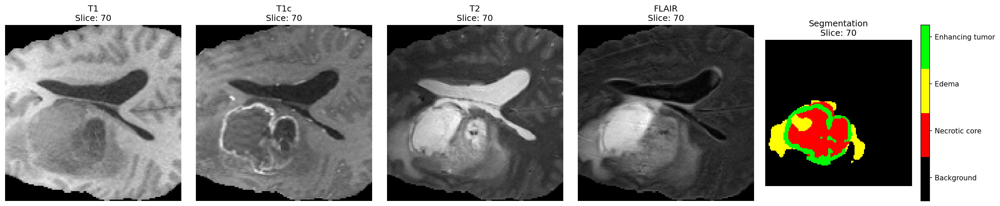

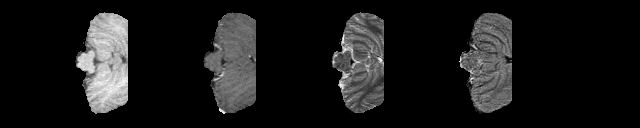

Processing Test Samples:   4%|▍         | 1/24 [00:08<03:21,  8.77s/it]


KeyboardInterrupt: 

In [14]:
import os
import torch
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import imageio
from tqdm import tqdm
from IPython.display import display, Image, HTML

def create_seg_colormap():
  
    return ListedColormap([
        [0, 0, 0],      # Background (black)
        [1, 0, 0],      # Necrotic core (red)
        [1, 1, 0],      # Peritumoral edema (yellow)
        [0, 1, 0]       # GD-enhancing tumor (green)
    ])

def load_and_preprocess(file_path):
 
    nii_img = nib.load(file_path)
    data = nii_img.get_fdata()
    data = np.nan_to_num(data, nan=0.0, posinf=0.0, neginf=0.0)
    return data

def normalize_channels(image_tensor):

    for i in range(image_tensor.shape[0]):
        min_val = torch.min(image_tensor[i])
        max_val = torch.max(image_tensor[i])
        if max_val - min_val != 0:
            image_tensor[i] = (image_tensor[i] - min_val) / (max_val - min_val)
        else:
            image_tensor[i] = torch.zeros_like(image_tensor[i])
    return image_tensor

def get_slice_indexes(volume):
  
    z_indices = np.where(volume.sum(axis=(0, 1)) > 0)[0]
    if len(z_indices) > 0:
        return z_indices[len(z_indices)//2]
    return volume.shape[2]//2

def process_test_case(test_folder_path, model, device):

    modalities = {
        'T1': 'Img1_Native_T1.nii',
        'T1c': 'Img2_T1_Gd_Weighted.nii',
        'T2': 'Img3_T2_Weighted.nii',
        'FLAIR': 'Img4_T2_FLAIR.nii'
    }
    
    images = {}
    for name, filename in modalities.items():
        data = load_and_preprocess(os.path.join(test_folder_path, filename))
        images[name] = data
    
    image_tensor = torch.stack([
        torch.tensor(images[mod], dtype=torch.float32)
        for mod in ['T1', 'T1c', 'T2', 'FLAIR']
    ])

    image_tensor = normalize_channels(image_tensor)
    
    model.eval()
    with torch.no_grad():
        output = model(image_tensor.unsqueeze(0).to(device))
        prediction = torch.argmax(output, dim=1).cpu().numpy()[0]
    
    return images, prediction

def create_static_plot(images, prediction, slice_idx=None):
   
    if slice_idx is None:
        slice_idx = get_slice_indexes(prediction)
    
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
   
    seg_cmap = create_seg_colormap()
    
    titles = ['T1', 'T1c', 'T2', 'FLAIR', 'Segmentation']
    for i, (title, img) in enumerate(zip(titles[:-1], [images['T1'], images['T1c'], images['T2'], images['FLAIR']])):
        axes[i].imshow(img[:, :, slice_idx], cmap='gray')
        axes[i].set_title(f"{title}\nSlice: {slice_idx}")
        axes[i].axis('off')
    
    im = axes[4].imshow(prediction[:, :, slice_idx], cmap=seg_cmap, vmin=0, vmax=3)
    axes[4].set_title(f"Segmentation\nSlice: {slice_idx}")
    axes[4].axis('off')
    
 
    cbar = plt.colorbar(im, ax=axes[4], ticks=[0.4, 1.2, 2.0, 2.8])
    cbar.ax.set_yticklabels(['Background', 'Necrotic core', 'Edema', 'Enhancing tumor'])
    
    plt.tight_layout()
    return fig

def process_slice_for_gif(slice_data, is_segmentation=False):
 
    if is_segmentation:
        colormap = create_seg_colormap()
        colored_slice = colormap(slice_data.astype(int))
        return (colored_slice[:, :, :3] * 255).astype(np.uint8)
    else:
        normalized = (slice_data - np.min(slice_data)) / (np.max(slice_data) - np.min(slice_data))
        return (normalized * 255).astype(np.uint8)

def create_combined_gif(images, prediction):
    
    frames = []
    num_slices = prediction.shape[2]
    
    for slice_idx in range(num_slices):
     
        processed_slices = []
        for img in [images['T1'], images['T1c'], images['T2'], images['FLAIR']]:
            slice_data = process_slice_for_gif(img[:, :, slice_idx])
            slice_data = np.stack([slice_data] * 3, axis=-1)
            processed_slices.append(slice_data)
        
  
        pred_slice = process_slice_for_gif(prediction[:, :, slice_idx], is_segmentation=True)
        processed_slices.append(pred_slice)
        
        combined_slice = np.hstack(processed_slices)
        frames.append(combined_slice)
    
    return frames

def visualize_test_results(base_test_folder, model, device, output_dir='./visualization_output/', num_samples=24):
   
    os.makedirs(output_dir, exist_ok=True)
    
    model.eval()
    
    for i in tqdm(range(1, num_samples + 1), desc="Processing Test Samples"):
        test_folder_path = os.path.join(base_test_folder, f"Test_{i}")
        
        try:
           
            images, prediction = process_test_case(test_folder_path, model, device)
            
            fig = create_static_plot(images, prediction)
            static_path = os.path.join(output_dir, f'static_test_{i}.png')
            fig.savefig(static_path, bbox_inches='tight', dpi=150)
            plt.close(fig)
            
            frames = create_combined_gif(images, prediction)
            gif_path = os.path.join(output_dir, f'test_{i}_combined.gif')
            imageio.mimsave(gif_path, frames, duration=0.1)
            
            print(f"\nResults for Test Sample {i}:")
            display(Image(filename=static_path))
            display(Image(filename=gif_path))
         
            display(HTML("<hr style='margin: 20px 0;'>"))
            
        except Exception as e:
            print(f"Error processing Test_{i}: {str(e)}")
            continue

if __name__ == "__main__":

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")
    
    try:
     
        model_path = "best_model.pth"
        model = UNet3D(in_channels=4, out_channels=4)
        checkpoint = torch.load(model_path, map_location=device)
        model.load_state_dict(checkpoint['model_state_dict'])
        model = model.to(device)
        print("Model loaded successfully")
        
        base_test_folder = r"E:\Test\Test_Data"
        visualize_test_results(base_test_folder, model, device)
        
    except Exception as e:
        print(f"Error during execution: {str(e)}")